In [2]:
"""
import kagglehub

# Download latest version
path = kagglehub.dataset_download("gvclsu/water-segmentation-dataset")

print("Path to dataset files:", path)
"""

Resuming download from 28311552 bytes (5096806661 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/gvclsu/water-segmentation-dataset?dataset_version_number=4 (28311552/5125118213) bytes left.


100%|██████████| 4.77G/4.77G [07:26<00:00, 11.4MB/s]


Extracting files...
Path to dataset files: C:\Users\Lucas\.cache\kagglehub\datasets\gvclsu\water-segmentation-dataset\versions\4


In [1]:
import os 
import keras
from tqdm import tqdm
from glob import glob
import tensorflow as tf
from numpy import zeros
from numpy.random import randint

# Data
from tensorflow.image import resize
from keras.preprocessing.image import load_img, img_to_array

# Data Viz
import matplotlib.pyplot as plt

# Model
from keras.layers import add
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import multiply
from keras.layers import concatenate
from keras.layers import Conv2DTranspose
from keras.layers import MaxPool2D
from keras.layers import UpSampling2D
from keras.layers import BatchNormalization
from keras.layers import Dropout

# Model Functions
from keras.models import Model
from tensorflow.keras.utils import plot_model
from keras.callbacks import Callback, ModelCheckpoint

In [2]:
def load_image(path):
    img = resize(img_to_array(load_img(path))/255., (256,256))
    return img

In [3]:
#image_path = "C:/Users/Lucas/.cache/kagglehub/datasets/gvclsu/water-segmentation-dataset/versions/4/water_v1/water_v1/JPEGImages/ADE20K"
image_path = 'D:/CV/4/water_v1/water_v1/JPEGImages/ADE20K'
total_images = len(os.listdir(image_path))
print(f"Total Number of Images : {total_images}")

Total Number of Images : 1888


In [4]:
all_image_paths = sorted(glob(image_path + "/*.png"))

In [5]:
def load_data(paths):
    images = zeros(shape=(len(paths), 256,256,3))
    masks = zeros(shape=(len(paths), 256,256,3))
    for i, path in tqdm(enumerate(paths), desc="Loading"):
        image = load_image(path)
        images[i] = image
        
        mask_path = path.replace("JPEGImages", "Annotations")
        mask = load_image(mask_path)
        masks[i] = mask
    return images, masks

In [7]:
train_paths = all_image_paths[:1000]
X_train, y_train = load_data(train_paths)

Loading: 1000it [00:49, 20.24it/s]


In [8]:
val_paths = all_image_paths[:1000]
X_val, y_val = load_data(val_paths)

Loading: 1000it [00:25, 39.22it/s]


In [9]:
def show_image(image, title=None):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [10]:
import numpy as np

In [11]:
def preprocess_data_2(image, mask):
    # Normalize images to [-1, 1]
    image = (image / 127.5) - 1
    
    # Convert mask to binary
    mask = (mask > 0.5).astype(np.float32)
    
    return image, mask

In [14]:
import numpy as np
def preprocess_data(image, mask):
    # Convert to float32 if not already
    image = image.astype(np.float32)
    
    # Color-based enhancement
    hsv = tf.image.rgb_to_hsv(image)
    hue, saturation, value = hsv[..., 0], hsv[..., 1], hsv[..., 2]
    
    # Enhance water features:
    # 1. Boost blue/cyan hues (typical water colors)
    water_hue_mask = tf.logical_and(hue >= 0.5, hue <= 0.7)
    hue = tf.where(water_hue_mask, hue * 1.2, hue)
    
    # 2. Reduce sky features (typically high value, low saturation)
    sky_mask = tf.logical_and(value > 0.7, saturation < 0.3)
    value = tf.where(sky_mask, value * 0.8, value)
    
    # Reconstruct HSV and convert back to RGB
    enhanced = tf.image.hsv_to_rgb(tf.stack([hue, saturation, value], axis=-1))
    
    # Apply mild contrast enhancement
    mean = tf.reduce_mean(enhanced)
    enhanced = (enhanced - mean) * 1.2 + mean
    enhanced = tf.clip_by_value(enhanced, 0, 1)
    
    # Normalize to [-1, 1] range
    enhanced = (enhanced - 0.5) * 2
    
    # Keep mask preprocessing as is
    mask = (mask > 0.5).astype(np.float32)
    
    return enhanced, mask

# Apply preprocessing to your data
X_train_prep, y_train_prep = preprocess_data(X_train, y_train)
X_val_prep, y_val_prep = preprocess_data(X_val, y_val)

In [12]:
X_train_prep, y_train_prep = preprocess_data_2(X_train, y_train)
X_val_prep, y_val_prep = preprocess_data_2(X_val, y_val)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.6598966].


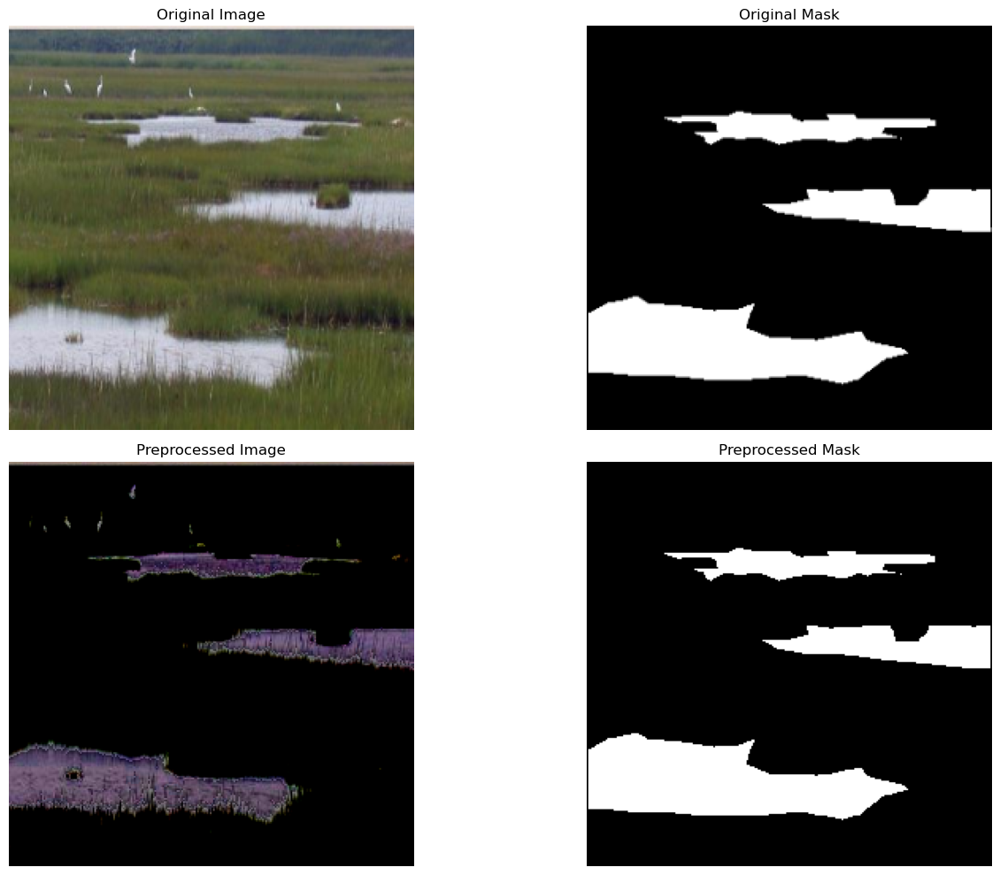

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


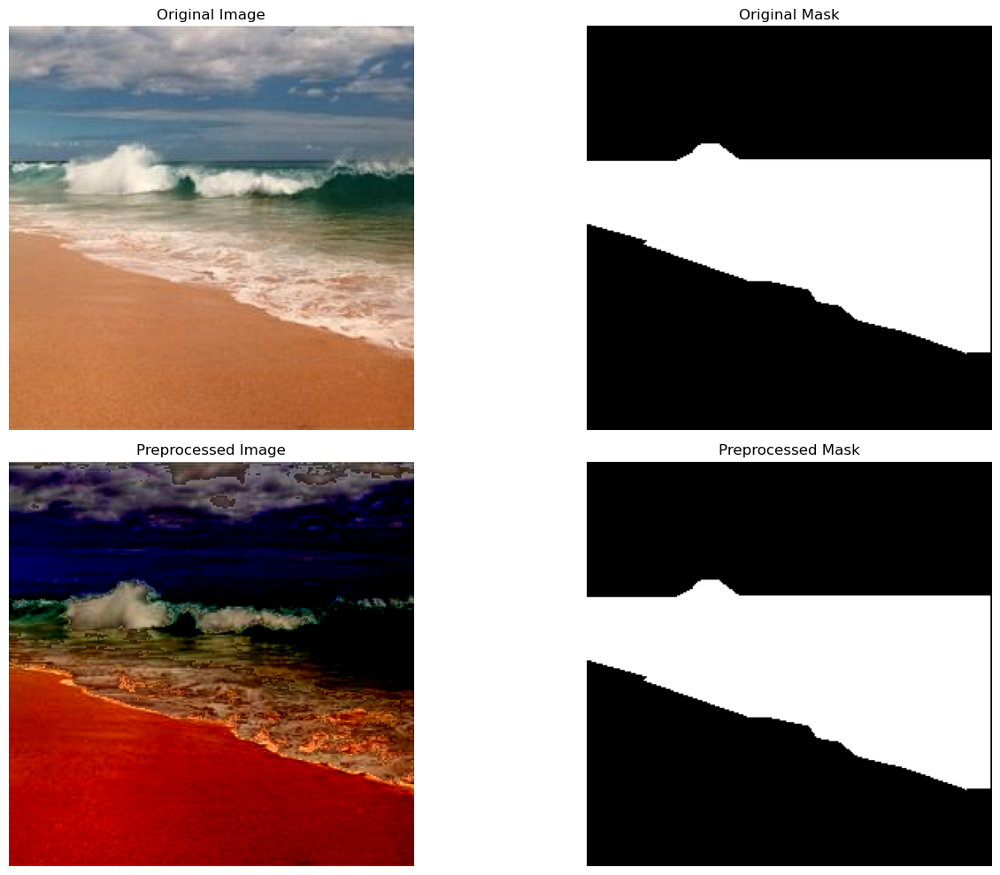

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


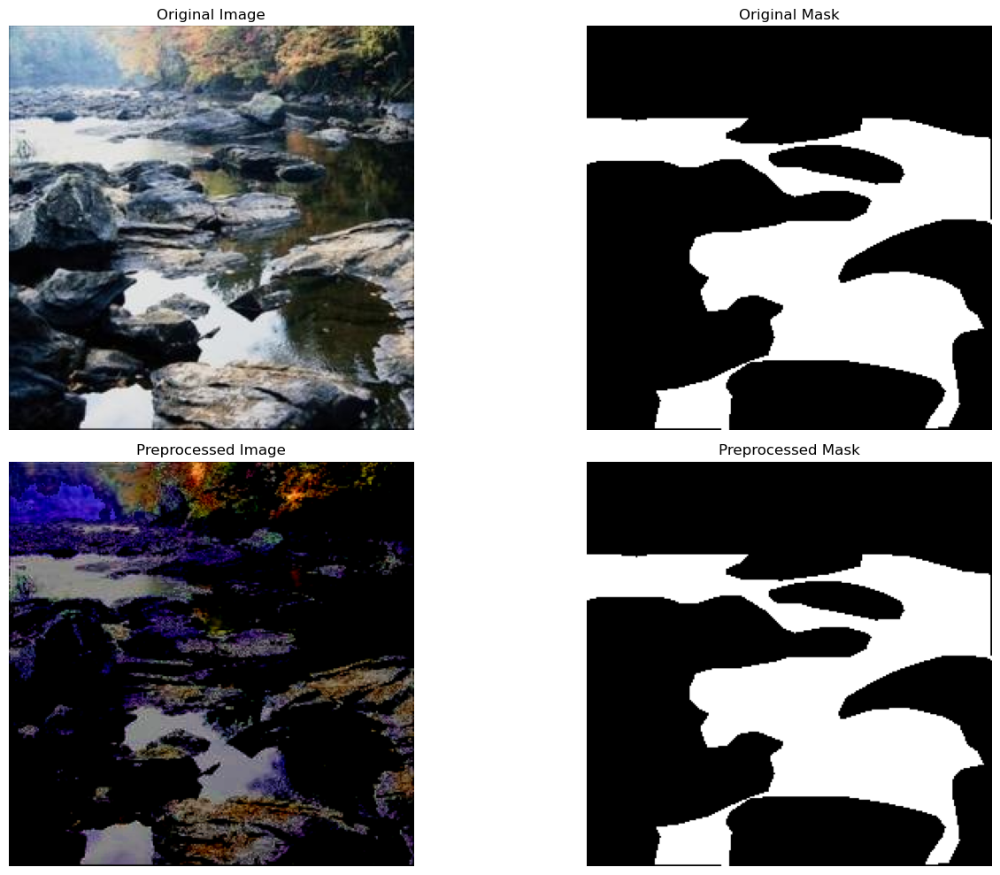

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


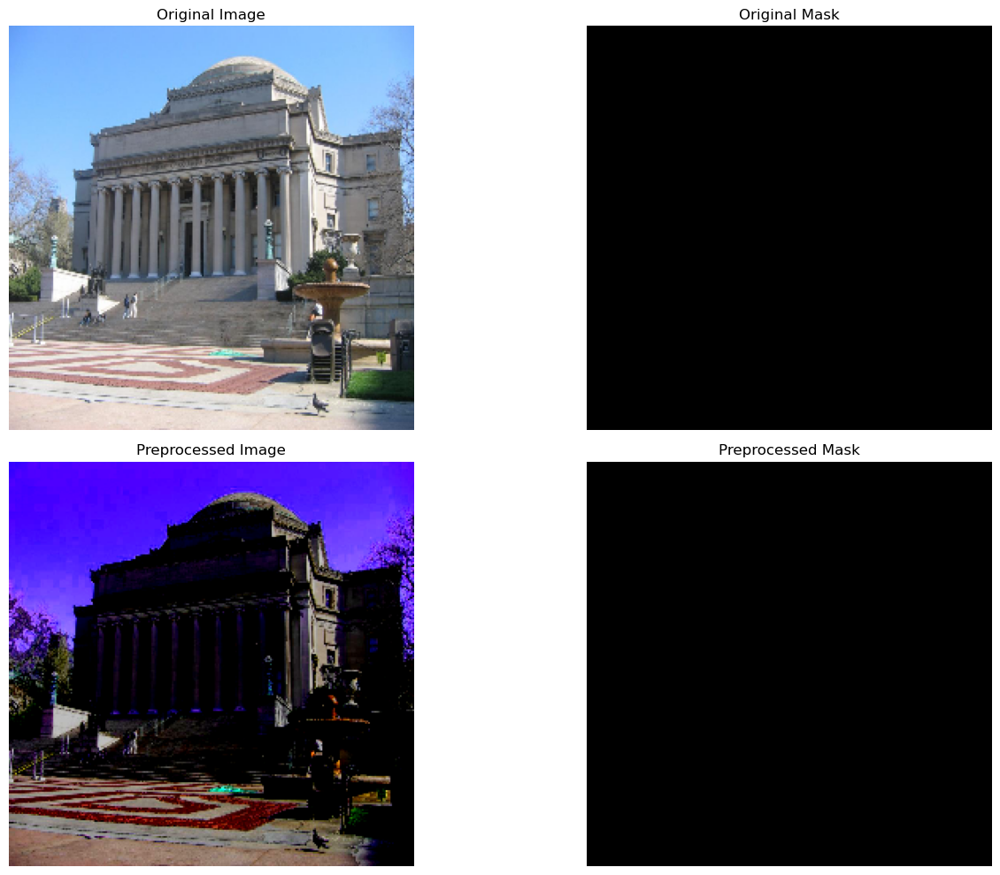

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9364799].


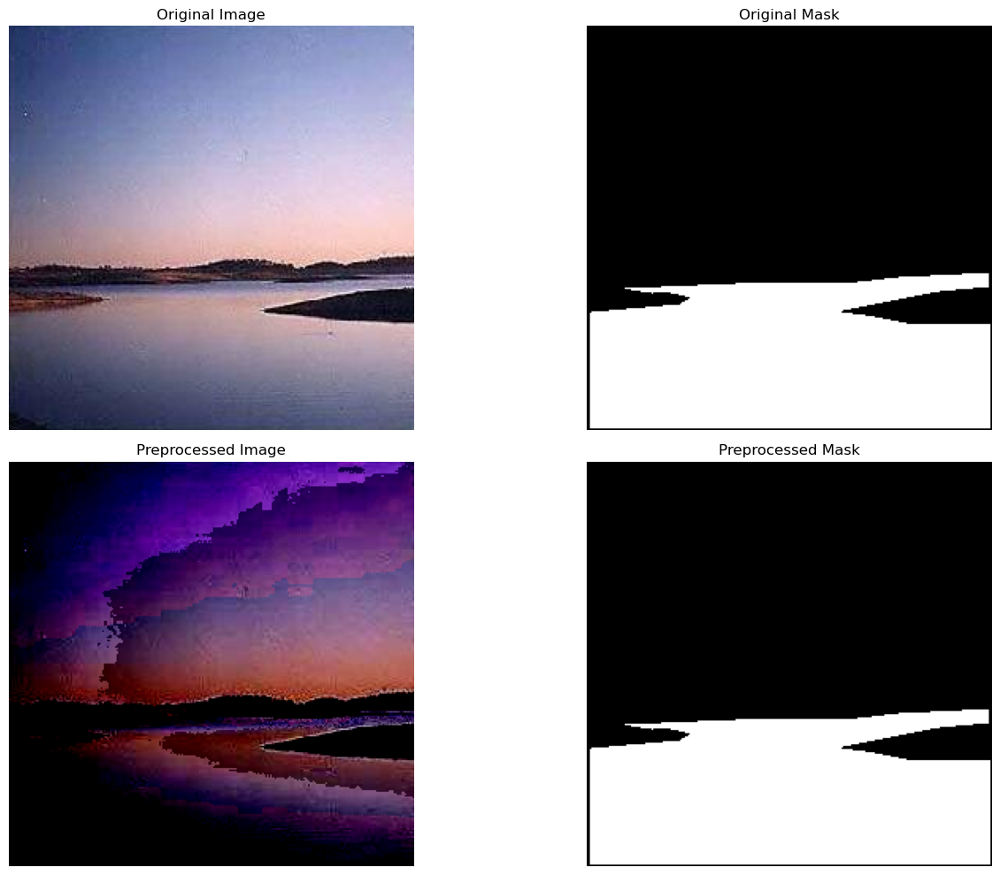

In [15]:
for i in range(5):
    id = randint(1000)
    image, mask = X_train[id], y_train[id]
    image_prep , mask_prep = X_val_prep[id], y_val_prep[id]
    plt.figure(figsize=(15,10))
    
    # Original Image
    plt.subplot(2,2,1)
    show_image(image, title="Original Image")
    
    # Original Mask
    plt.subplot(2,2,2)
    show_image(mask, title="Original Mask")
    
    # Preprocessed Image
    plt.subplot(2,2,3)
    show_image(image_prep, title="Preprocessed Image")
    
    # Preprocessed Mask
    plt.subplot(2,2,4)
    show_image(mask_prep, title="Preprocessed Mask")
    
    plt.tight_layout()
    plt.show()

In [16]:
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Input, MaxPooling2D
from tensorflow.keras.models import Model
import numpy as np

In [30]:
def create_fcn():
    # Input
    #inputs = Input(shape=(256, 256, 3))
    inputs = Input(shape=(256, 256, 4))
    
    # Encoder (VGG-style)
    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    
    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    
    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    
    # FCN specific part
    # Reduce depth and prepare for upsampling
    x = Conv2D(512, (1, 1), activation='relu', padding='same')(x)
    
    # Decoder (Upsampling)
    x = Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same')(x)
    x = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same')(x)
    x = Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same')(x)
    
    # Final output layer
    outputs = Conv2D(3, (1, 1), activation='sigmoid')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    return model

In [17]:
def create_unet():
    # Input
    inputs = Input(shape=(256, 256, 3))
    
    # Encoder Path (Contracting Path)
    # Block 1
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    
    # Block 2
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    # Block 3
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    
    # Block 4
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)
    
    # Bridge
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    
    # Decoder Path (Expanding Path)
    # Block 6
    up6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = concatenate([up6, conv4])
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(concat6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    
    # Block 7
    up7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = concatenate([up7, conv3])
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(concat7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)
    
    # Block 8
    up8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    concat8 = concatenate([up8, conv2])
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(concat8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)
    conv8 = BatchNormalization()(conv8)
    
    # Block 9
    up9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    concat9 = concatenate([up9, conv1])
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(concat9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)
    conv9 = BatchNormalization()(conv9)
    
    # Output - Changed from 1 to 3 channels to match your masks
    outputs = Conv2D(3, 1, activation='sigmoid')(conv9)
    
    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create and compile the model
model_unet = create_unet()
model_unet.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.MeanIoU(num_classes=2)]
)

In [11]:
def create_improved_fcn():
    inputs = Input(shape=(256, 256, 3))
    
    # Encoder
    # Block 1
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    
    # Block 2
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    
    # Block 3
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    
    # Middle
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    
    # Decoder with skip connections
    up1 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4), conv3], axis=3)
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(up1)
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    
    up2 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5), conv2], axis=3)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up2)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    
    up3 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6), conv1], axis=3)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    
    outputs = Conv2D(3, (1, 1), activation='sigmoid')(conv7)
    
    model = Model(inputs=inputs, outputs=outputs)
    return model


In [34]:
model_base = create_fcn()
model_base.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']  # Added IoU metric
)

In [ ]:
model_base = create_fcn()
model_base.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']  # Added IoU metric
)

In [12]:
model_imporved = create_improved_fcn()
model_imporved.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']  # Added IoU metric
)
model_imporved.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │     36,928 │ conv2d[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │    147,584 │ conv2d_2[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_4[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │  1,180,160 │ max_pooling2d_2[… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │  2,359,808 │ conv2d_6[0][0]    │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 64, 64,    │    524,544 │ conv2d_7[0][0]    │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 512)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 64, 64,    │  1,179,904 │ concatenate[0][0] │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 64, 64,    │    590,080 │ conv2d_8[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 128, 128,  │    131,200 │ conv2d_9[0][0]  

 Total params: 7,697,475 (29.36 MB)

 Trainable params: 7,697,475 (29.36 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.metrics import MeanIoU
# Callbacks
# Callbacks
# Callbacks for better training
callbacks = [
    ModelCheckpoint('best_fcn_model.keras', 
                    monitor='val_loss',
                    mode='min', 
                    save_best_only=True,
                    verbose=1),
    ReduceLROnPlateau(monitor='val_loss',
                      factor=0.1,
                      patience=5,
                      min_lr=1e-6,
                      verbose=1),
    EarlyStopping(monitor='val_loss',
                  patience=10,
                  restore_best_weights=True,
                  verbose=1)
]

# Train the model
history = model_unet.fit(
    X_train_prep, y_train_prep,
    validation_data=(X_val_prep, y_val_prep),
    batch_size=8,
    epochs=20,
    callbacks=callbacks
)

Epoch 1/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.4366 - loss: 0.6339 - mean_io_u: 0.3885 
Epoch 1: val_loss improved from inf to 8.02586, saving model to best_fcn_model.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 1896s 15s/step - accuracy: 0.4373 - loss: 0.6333 - mean_io_u: 0.3886 - val_accuracy: 0.5372 - val_loss: 8.0259 - val_mean_io_u: 0.4449 - learning_rate: 0.0010
Epoch 2/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.6462 - loss: 0.4425 - mean_io_u: 0.3912 
Epoch 2: val_loss improved from 8.02586 to 1.28695, saving model to best_fcn_model.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 1847s 15s/step - accuracy: 0.6461 - loss: 0.4423 - mean_io_u: 0.3912 - val_accuracy: 0.4232 - val_loss: 1.2869 - val_mean_io_u: 0.3942 - learning_rate: 0.0010
Epoch 3/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.4861 - loss: 0.3984 - mean_io_u: 0.3952 
Epoch 3: val_loss did not improve from 1.28695
125/125 ━━━━━━━━━━━━━━━━━━━━ 1841s 15s/step - accuracy: 0.4861 - loss: 0.3984 - me

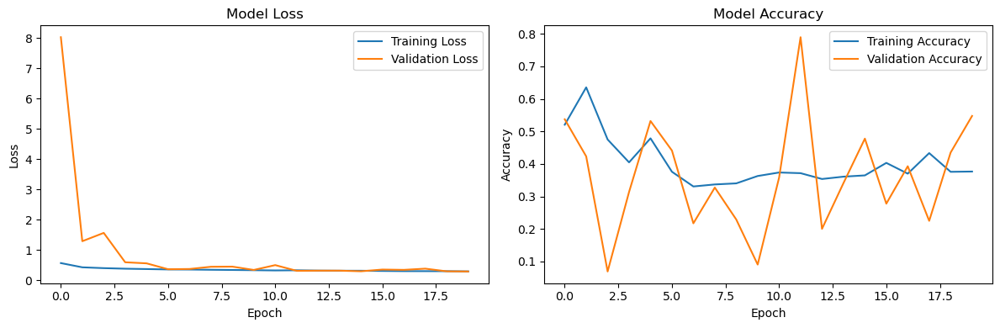

In [19]:
# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


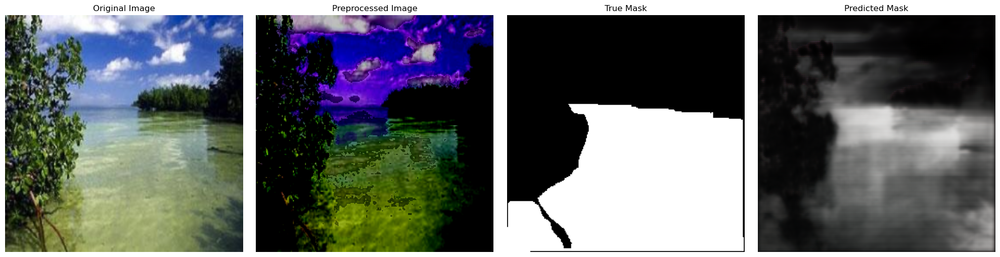

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9598327..0.963606].


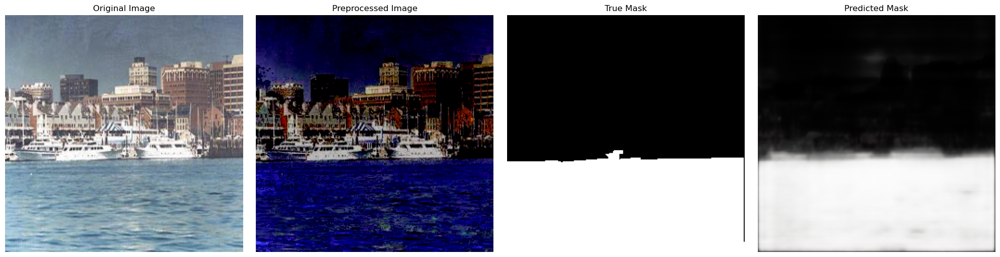

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


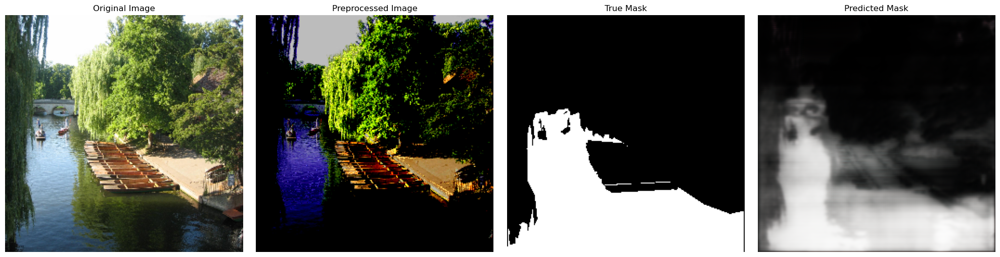

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


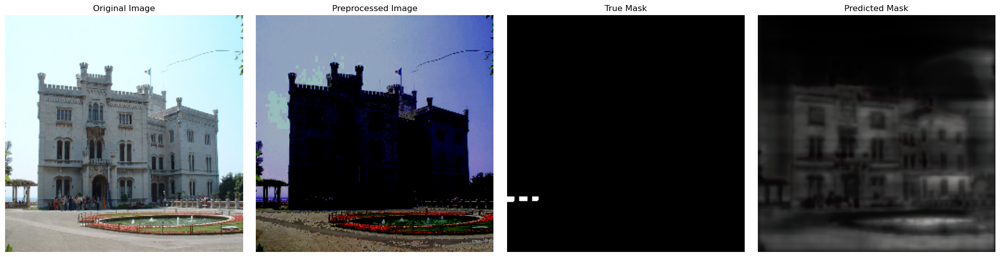

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


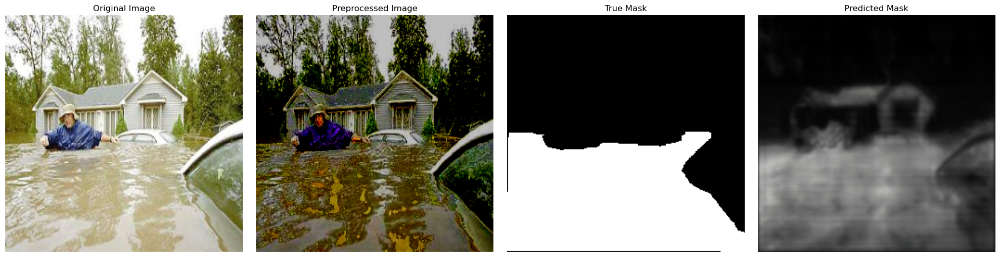

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


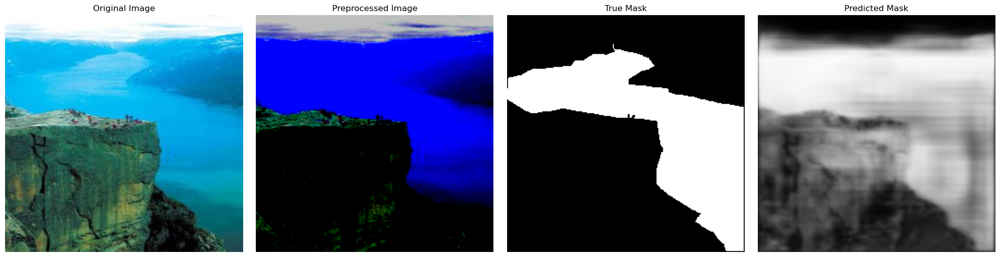

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


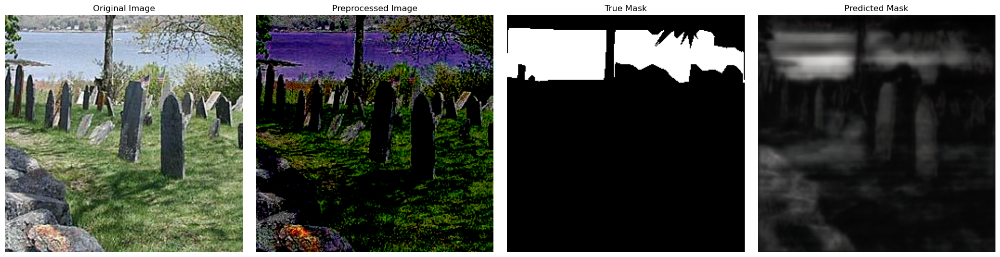

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


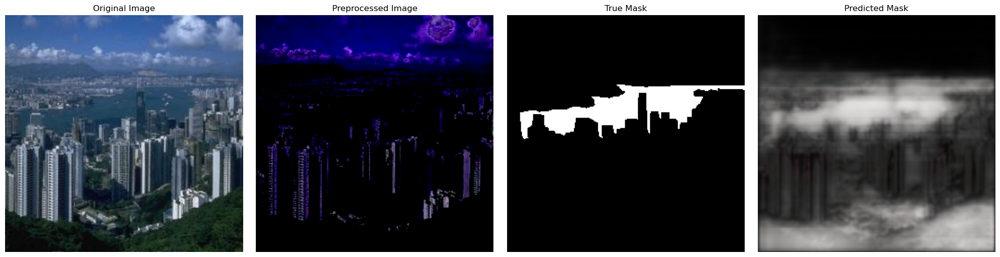

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


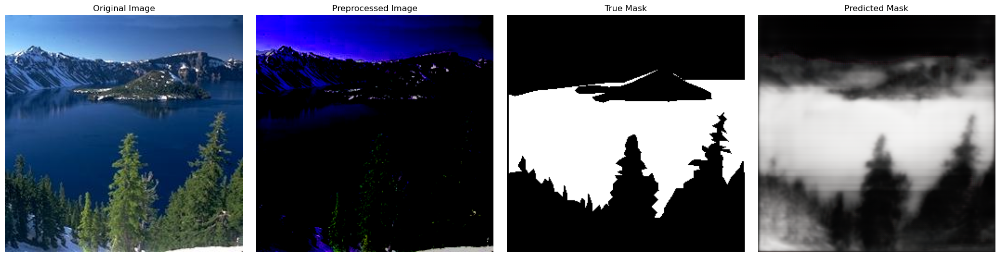

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


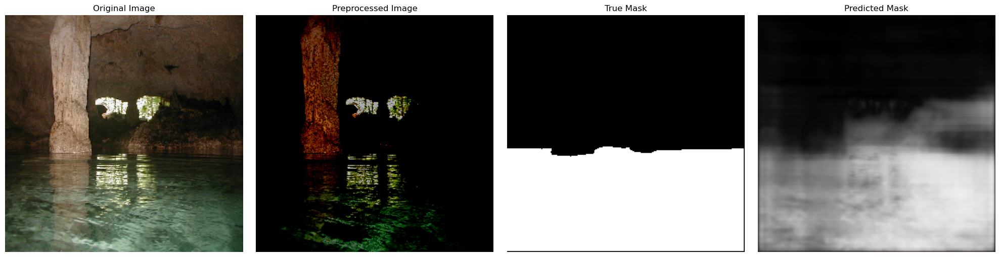

In [21]:
def show_predictions(model, X_orig, X_prep, y, num_samples=10):
    for i in range(num_samples):
        idx = np.random.randint(len(X_prep))
        
        # Get prediction
        pred = model.predict(X_prep[idx:idx+1])[0]
        
        plt.figure(figsize=(20, 5))
        
        # Original Image
        plt.subplot(1, 4, 1)
        show_image(X_orig[idx], title='Original Image')
        
        # Preprocessed Image
        plt.subplot(1, 4, 2)
        show_image(X_prep[idx], title='Preprocessed Image')
        
        # True Mask
        plt.subplot(1, 4, 3)
        show_image(y[idx], title='True Mask')
        
        # Predicted Mask
        plt.subplot(1, 4, 4)
        show_image(pred, title='Predicted Mask')
        
        plt.tight_layout()
        plt.show()

# Show predictions with both original and preprocessed images
show_predictions(model_unet, X_val, X_val_prep, y_val_prep)